In [2]:
pip install folium

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 95.0/95.0 KB 467.0 kB/s eta 0:00:00a 0:00:01
Note: you may need to restart the kernel to use updated packages.


In [3]:
import folium
%matplotlib inline
import pandas as pd
import re
import os
import branca.colormap as cm
import re
import numpy as np
#import matplotlib as mpl
#import matplotlib.pyplot as plt
#from matplotlib import colors
#from scipy import stats

# Simple Dot Plot On Map

In [4]:
data = pd.read_pickle('data/listings_cleaned.pkl')
data = pd.DataFrame(data, columns = ['latitude','longitude']) #[:50]  <-this kind of slice is useful for developing a map
data.head()

FileNotFoundError: [Errno 2] No such file or directory: 'data/listings_cleaned.pkl'

In [3]:
#create a map
this_map = folium.Map(prefer_canvas=True)

def plotDot(point):
    '''input: series that contains a numeric named latitude and a numeric named longitude
    this function creates a CircleMarker and adds it to your this_map'''
    folium.CircleMarker(location=[point.latitude, point.longitude],
                        radius=2,
                        weight=0).add_to(this_map)

#use df.apply(,axis=1) to iterate through every row in your dataframe
data.apply(plotDot, axis = 1)


#Set the zoom to the maximum possible
this_map.fit_bounds(this_map.get_bounds())

#Save the map to an HTML file
#this_map.save(os.path.join('html_map_output/simple_dot_plot.html'))

this_map

# Dots with Popup Info

In [5]:
data = pd.read_pickle('data/listings_cleaned.pkl')
data = pd.DataFrame(data, columns = ['latitude','longitude','listing_name']) #[:50]  <-this kind of slice is useful for developing a map
data.head()

,latitude,longitude,listing_name
listing_id,,,
5794291,45.533373,-122.648236,Private suites near it all- Room #6
15358320,45.532048,-122.641223,Bohemian Escape
15164536,45.533932,-122.647206,NE BUNK-HOUSE : Single bed - TOP
6106997,45.534491,-122.646883,"LOCATION NE! ""Mt Hood"" : King bed"
5134256,45.533274,-122.646870,Private suites near it all- Room #4


In [10]:
#create a map
this_map = folium.Map(prefer_canvas=True)

def plotDot(point):
    '''input: series that contains a numeric named latitude and a numeric named longitude
    this function creates a CircleMarker and adds it to your this_map'''
    folium.CircleMarker(location=[point.latitude, point.longitude],
                        radius=2,
                        weight=0,#remove outline
                        popup = point.listing_name,
                        fill_color='#000000').add_to(this_map)

#use df.apply(,axis=1) to iterate through every row in your dataframe
data.apply(plotDot, axis = 1)


#Set the zoom to the maximum possible
this_map.fit_bounds(this_map.get_bounds())

#Save the map to an HTML file
#this_map.save(os.path.join('html_map_output/basic_pop_up.html'))

this_map

# Popups with Links

In [10]:
data = pd.read_pickle('data/listings_cleaned.pkl')
data = pd.DataFrame(data, columns = ['latitude','longitude','listing_name','listing_url','host_name','host_url'])[:50]#  <-this kind of slice is useful for developing a map
data.head()

,latitude,longitude,listing_name,listing_url,host_name,host_url
listing_id,,,,,,
5794291,45.533373,-122.648236,Private suites near it all- Room #6,https://www.airbnb.com/rooms/5794291,Phil,https://www.airbnb.com/users/show/3029738
15358320,45.532048,-122.641223,Bohemian Escape,https://www.airbnb.com/rooms/15358320,Pamela,https://www.airbnb.com/users/show/78494301
15164536,45.533932,-122.647206,NE BUNK-HOUSE : Single bed - TOP,https://www.airbnb.com/rooms/15164536,Ian & Sharmil,https://www.airbnb.com/users/show/17261537
6106997,45.534491,-122.646883,"LOCATION NE! ""Mt Hood"" : King bed",https://www.airbnb.com/rooms/6106997,Ian & Sharmil,https://www.airbnb.com/users/show/17261537
5134256,45.533274,-122.646870,Private suites near it all- Room #4,https://www.airbnb.com/rooms/5134256,Phil,https://www.airbnb.com/users/show/3029738


In [12]:
#create a map
this_map = folium.Map(prefer_canvas=True)

def makeHref(url,link_text = None):
    if link_text == None:
        link_text = str(url)
    return '<a href="' + url + '"target="_blank">' + re.sub(r"[']+", "\\\\'", link_text[:45]) +'</a>'

def popopHTMLString(point):
    '''input: a series that contains a url somewhere in it and generate html'''
    html = 'Listing: ' + makeHref(point.listing_url, point.listing_name) + '<br>'
    html += 'Host: ' + makeHref(point.host_url, point.host_name)
    return html

def plotDot(point):
    '''input: series that contains a numeric named latitude and a numeric named longitude
    this function creates a CircleMarker and adds it to your this_map'''
    htmlString = folium.Html(popopHTMLString(point), script=True)
    folium.CircleMarker(location=[point.latitude, point.longitude],
                        radius=2,
                        weight=0,#remove outline
                        popup = folium.Popup(htmlString),
                        fill_color='#000000').add_to(this_map)

#use df.apply(,axis=1) to iterate through every row in your dataframe
data.apply(plotDot, axis = 1)

#Set the zoom to the maximum possible
this_map.fit_bounds(this_map.get_bounds())

#Save the map to an HTML file
#this_map.save(os.path.join('html_map_output/html_pop_up.html'))


this_map

# Color by value using a Colormap

In [20]:
data = pd.read_pickle('data/listings_cleaned.pkl')
data = pd.DataFrame(data, columns = ['latitude','longitude','listed_price','accommodates'])[:50]#  <-this kind of slice is useful for developing a map
data['price_per_person'] = data.listed_price / data.accommodates
data.drop(['listed_price','accommodates'], axis='columns', inplace=True)
data.head()

,latitude,longitude,price_per_person
listing_id,,,
5794291,45.533373,-122.648236,50.000000
15358320,45.532048,-122.641223,32.500000
15164536,45.533932,-122.647206,42.000000
6106997,45.534491,-122.646883,21.666667
5134256,45.533274,-122.646870,35.000000


In [16]:
blRd = cm.LinearColormap(['blue', 'red'],
                           vmin=3, vmax=10)

blRd

In [97]:
#create a map
this_map = folium.Map(prefer_canvas=True)

#create a color map
color_var = 'price_per_person' #what variable will determine the color
cmap = cm.LinearColormap(['blue', 'red'],
                         vmin=data[color_var].quantile(0.05), vmax=data[color_var].quantile(0.95),
                         caption = color_var)

#Add the color map legend to your map
this_map.add_child(cmap)

def plotDot(point):
    '''input: series that contains a numeric named latitude and a numeric named longitude
    this function creates a CircleMarker and adds it to your this_map'''
    folium.CircleMarker(location=[point.latitude, point.longitude],
                        fill_color=cmap(point[color_var]),
                        radius=2,
                        weight=0).add_to(this_map)

#use df.apply(,axis=1) to iterate through every row in your dataframe
data.apply(plotDot, axis = 1)

#Set the zoom to the maximum possible
this_map.fit_bounds(this_map.get_bounds())

#Save the map to an HTML file
#this_map.save(os.path.join('html_map_output/color_by_value.html'))


this_map

KeyError: 'price_per_person'

# Color Points by quartile groupings

In [98]:
data = pd.read_pickle('data/listings_cleaned.pkl')
data = pd.DataFrame(data, columns = ['latitude','longitude','listed_price','listing_name','listing_url','host_name','host_url'])
data.head()

,latitude,longitude,listed_price,listing_name,listing_url,host_name,host_url
listing_id,,,,,,,
5794291,45.533373,-122.648236,100.0,Private suites near it all- Room #6,https://www.airbnb.com/rooms/5794291,Phil,https://www.airbnb.com/users/show/3029738
15358320,45.532048,-122.641223,65.0,Bohemian Escape,https://www.airbnb.com/rooms/15358320,Pamela,https://www.airbnb.com/users/show/78494301
15164536,45.533932,-122.647206,42.0,NE BUNK-HOUSE : Single bed - TOP,https://www.airbnb.com/rooms/15164536,Ian & Sharmil,https://www.airbnb.com/users/show/17261537
6106997,45.534491,-122.646883,65.0,"LOCATION NE! ""Mt Hood"" : King bed",https://www.airbnb.com/rooms/6106997,Ian & Sharmil,https://www.airbnb.com/users/show/17261537
5134256,45.533274,-122.646870,70.0,Private suites near it all- Room #4,https://www.airbnb.com/rooms/5134256,Phil,https://www.airbnb.com/users/show/3029738


In [107]:
color_var = 'listed_price'

cmap = cm.LinearColormap(['cornflowerblue', 'limegreen', 'orange', 'red']
                        )
cmap = cmap.to_step(
    n=4,
    data=data[color_var],
    method='quantiles')
cmap.caption = color_var + " grouped by quartile"

this_map = folium.Map(prefer_canvas=True)
this_map.add_child(cmap)
this_map

#As you can see there is a major limitation with this map:
#The data data in the color_var is so skewed that the 4th quartile
#completely dominates the legend.

In [135]:
cmap_linear = cm.LinearColormap(['cornflowerblue', 'limegreen', 'orange', 'red'])
cmap = cmap_linear.to_step(
    n=4,
    data=data[color_var],
    method='quantiles')

cmap_legend = cmap_linear.to_step(4)
cmap_legend.caption = color_var + " grouped by quartile"
this_map = folium.Map(prefer_canvas=True)
this_map.add_child(cmap_legend)
this_map

#this Makes the a well proportioned colorbar for the legend 
#and you can still use cmap for the color map BUT...
#there is no way to change the labels on top

In [102]:
import pdir
pdir(cmap)

abstract class:
    __subclasshook__
attribute access:
    __delattr__, __dir__, __getattribute__, __setattr__
object customization:
    __format__, __hash__, __init__, __new__, __repr__, __sizeof__, __str__
other:
    _children, _env, _id, _name, _parent, _template, caption, colors, index, vmax, vmin
pickle:
    __reduce__, __reduce_ex__
rich comparison:
    __eq__, __ge__, __gt__, __le__, __lt__, __ne__
special attribute:
    __class__, __dict__, __doc__, __module__, __weakref__
function:
    _get_self_bounds: Computes the bounds of the object itself (not including it's children)
    _repr_html_: 
    add_child: Add a child.
    add_children: Add a child.
    add_to: Add element to a parent.
    get_bounds: Computes the bounds of the object and all it's children
    get_name: Returns a string representation of the object.
    get_root: Returns the root of the elements tree.
    render: Renders the HTML representation of the element.
    rgb_bytes_tuple: Provides the color correspondi

In [25]:
#create a map
#this_map = folium.Map(prefer_canvas=True)
from matplotlib import colors

#create a color map
my_colors = [(.4, .4, 1), (0, .9, 0) ,(1, .6, 0) , (1, 0, 0)] 
cm = colors.LinearSegmentedColormap.from_list("MyMap", my_colors, N=4) #cm is the color map
#norm = colors.Normalize(0, 1)

#color_dict = {data.ix[p][color_var]:colors.to_hex(cm(data.ix[p].color_group-.0001)) for p in data.T}
cm

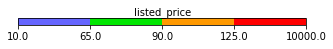

In [32]:
fig = plt.figure(figsize=(4, .1))
ax = fig.add_axes([1, 1, 1, 1])

leg = mpl.colorbar.ColorbarBase(ax, cmap=cm,
                                norm=norm,
                                orientation='horizontal')
leg.set_ticks([q/4 for q in range(5)])
leg.set_ticklabels([data[color_var].quantile(q/4) for q in range(5)])

fig.text(1.5, 2, color_var,
        horizontalalignment='center',
        verticalalignment='bottom')

fig.savefig(str('legends/legend_'+color_var+'_quartiles.png'), bbox_inches='tight',transparent=True)
#plt.close(fig)
#To DO:  there has to be a smarter way to do this (dealing with the "URL" issue)
FloatImage(str(server_url + 'files/legends/legend_'+color_var+'_quartiles.png'),bottom=90, left=65).add_to(this_map)



In [33]:
def popopHTMLString(point):
    '''input: a series that contains a url somewhere in it and generate html'''
    html = 'Listing: '
    html += '<a href="'
    html += point.listing_url
    html += '"target="_blank">'
    html += re.sub(r"[']+", "\\\\'", point.listing_name)  #to put a \ in front of any ' in the name
    html += ' </a>'

    html += ' <br>'
    html += 'Host: '
    html += '<a href="'
    html += point.host_url
    html += '"target="_blank">'
    html += re.sub(r"[']+", "\\\\'", point.host_name)
    html += ' </a>'
    
    html += ' <br>'
    html += 'listed_price = '
    html += str('${:,.2f}'.format(point.listed_price))
    
    return html


In [34]:
def plotDot(point):
    '''input: series that contains a numeric named latitude and a numeric named longitude
    this function creates a CircleMarker and adds it to your this_map'''
    htmlString = folium.Html(popopHTMLString(point), script=True)
    folium.CircleMarker(location=[point.latitude, point.longitude],
                        fill_color=color_dict[point[color_var]],   ####NOTE THE CHANGE IN THE COLOR
                        radius=2,
                        popup = folium.Popup(htmlString),
                        weight=0).add_to(this_map)

 
    
#use df.apply(,axis=1) to iterate through every row in your dataframe
data.apply(plotDot, axis = 1)


#Set the zoom to the maximum possible
this_map.fit_bounds(this_map.get_bounds())

#Save the map to an HTML file
#this_map.save(os.path.join('html_map_output/color_by_value_quartile.html'))

this_map